In [7]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import pingouin as pg

import glob
import os

pd.options.display.max_info_rows = 30000000
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

sns.set_theme(style='darkgrid')

# Tamaño figuras
plt.rcParams["figure.figsize"] = (20,8)
plt.rcParams["figure.dpi"] = 600

pd.options.mode.chained_assignment = None

# Paleta de colores
color = ['#2a9d8f', '#e9c46a', '#d48251', '#b13c47']

color2 = ['#264653', '#2a9d8f', '#e9c46a', '#d48251', '#b13c47']

In [9]:
# Join all of csv files of the folder ../resultados, mantaining the header of the first file
path = r'../resultados-MSI' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))

all_files = [f for f in all_files if os.stat(f).st_size > 100]

df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df = pd.concat(df_from_each_file, ignore_index=True)

df['algorithm'] = df['algorithm'].replace('fges', 'Fges')
df['algorithm'] = df['algorithm'].replace('fges-faithfulness', 'Fges-faithfulness')
df['algorithm'] = df['algorithm'].replace('ges', 'GES')
df.loc[df['algorithm'] == 'GES', 'threads'] = 1
df['algorithm'] = df['algorithm'].replace('ges parallel', 'GES')
df['algorithm'] = df['algorithm'].replace('pges', 'pGES')
df['algorithm'] = df['algorithm'].replace('pges update', 'pGES up')
df['algorithm'] = df['algorithm'].replace('pges update speed', 'pGES up sp')
df['algorithm'] = df['algorithm'].replace('pges-jc', 'pGES-jc')
df['algorithm'] = df['algorithm'].replace('pges-jc update', 'pGES-jc up')
df['algorithm'] = df['algorithm'].replace('pges-jc update speed', 'pGES-jc up sp')

df.head()

,algorithm,network,bbdd,threads,pges_threads,interleaving,seed,SHD,loglike,bdeu,deltaMB,deltaMB+,deltaMB-,iterations,time(s),circular_ges_c3,andes,andes.xbif50001_,8,8.1,2147483647,-1,159,-0.5428451182933828,-472245.2691767308,350.0,22.0,328.0,6,10.802,circular_ges_c1,barley,barley.xbif50001_,63,0.0,-265563.9285514598,152.0,16.0,136.0,9,2.643,circular_ges_c2,water,water.xbif50001246_,99,-0.47783733138485807,-69954.99272053511,234.0,8.0,226.0,...,-55143.1716678629,0.203,-0.23249829816102427,-47066.29410032114,2.174,-0.4599902289423925,-164502.3803326145,0.651,-0.4796606310282565,-67510.27462989389,0.373,-0.593541849771886,-68145.42192633358,0.336,139,-48535.39410594059,1.027,-0.42044995473988445,-65784.03088850914,0.181,-0.37330524572130747,-53611.71405263197,-1.398839978454058,-266153.2412003227,1.865,-0.48227451548686223,-65677.51403686042,0.174,-47763.49976565454,1.683,-0.2215861192559345,-47765.209323590185,0.986,-266741.96837029816,1.844,-0.5015334940199936,-68226.8655783406,-0.49862070754291715,-65982.51162800945,-0.6129413275723147,-68095.69632863619,0.649,-0.22347461023899437,-47477.17940633598,1.123,247,-141611.45063336397,688.0,422.0,8.955
0,pGES-jc,pigs,pigs.xbif_,8.0,8.0,2.147484e+09,-1.0,0.0,-1.036152,-1.674757e+06,0.0,0.0,0.0,4.0,45.158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,pges update noParallel,link,link.xbif50004_,8.0,2.0,2.147484e+09,-1.0,968.0,0.000000,-1.136825e+06,1978.0,672.0,1306.0,4.0,225.795,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,pGES up,pathfinder,pathfinder.xbif50003_,8.0,8.0,2.147484e+09,-1.0,280.0,0.000000,-1.404375e+05,742.0,324.0,418.0,5.0,3.713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GES,munin,munin.xbif50001_,1.0,1.0,-1.000000e+00,-1.0,1509.0,0.000000,-9.350924e+05,3232.0,1060.0,2172.0,1.0,3404.928,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,pGES up,alarm,alarm.xbif50006_,8.0,8.0,2.147484e+09,-1.0,7.0,-0.390713,-5.380120e+04,14.0,0.0,14.0,5.0,0.181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Tablas de datos

In [11]:
df_unstack = df.drop(["bbdd", "interleaving", "seed", "SHD", "loglike", "bdeu", "deltaMB", "deltaMB+", "deltaMB-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "threads", "pges_threads"], observed=True).mean().unstack(0)

time(s)                       \
network                                         alarm      andes    barley   
algorithm              threads pges_threads                                  
Fges                   8.0     1.0           0.363000   1.361364  2.285636   
Fges-faithfulness      8.0     1.0           0.431455   4.997364  6.084636   
GES                    1.0     1.0                NaN  25.533182       NaN   
                       8.0     1.0           0.119636  11.756545  0.611727   
pGES                   8.0     2.0                NaN  10.379545       NaN   
                               4.0                NaN   4.548818       NaN   
                               8.0                NaN   3.458636       NaN   
pGES up                8.0     2.0                NaN   4.368182       NaN   
                               4.0                NaN   2.644000       NaN   
                               8.0           0.125364   2.708091  0.547636   
pGES up sp             8.0     2.0                NaN   5.497455       NaN   
                               4.0                NaN   3.285909       NaN   
                               8.0                NaN   2.969545       NaN   
pGES-jc                8.0     2.0                NaN  15.287091       NaN   
                               4.0                NaN   6.092545       NaN   
                               8.0                NaN   4.302182       NaN   
pGES-jc up             8.0     2.0                NaN   5.654364       NaN   
                               4.0                NaN   3.174091       NaN   
                               8.0           0.176545   2.898909  1.186818   
pGES-jc up sp          8.0     2.0                NaN   6.694091       NaN   
                               4.0                NaN   3.851000       NaN   
                               8.0                NaN   3.466364       NaN   
pges update noParallel 8.0     2.0                NaN   4.584091       NaN   
                               4.0                NaN   2.668909       NaN   
                               8.0                NaN   2.709182       NaN   

                                                                             \
network                                         child  diabetes  hailfinder   
algorithm              threads pges_threads                                   
Fges                   8.0     1.0           2.704636       NaN  864.371000   
Fges-faithfulness      8.0     1.0           3.027545       NaN  866.063000   
GES                    1.0     1.0                NaN       NaN    0.681667   
                       8.0     1.0           0.016727  156.9938    0.199909   
pGES                   8.0     2.0                NaN       NaN    0.451667   
                               4.0                NaN       NaN    0.276667   
                               8.0                NaN       NaN    0.323667   
pGES up                8.0     2.0                NaN       NaN    0.253667   
                               4.0                NaN       NaN    0.196000   
                               8.0           0.057182   97.8675    0.198455   
pGES up sp             8.0     2.0                NaN       NaN    0.211333   
                               4.0                NaN       NaN    0.177667   
                               8.0                NaN       NaN    0.183333   
pGES-jc                8.0     2.0                NaN       NaN    0.534000   
                               4.0                NaN       NaN    0.333667   
                               8.0                NaN       NaN    0.307333   
pGES-jc up             8.0     2.0                NaN       NaN    0.294333   
                               4.0                NaN       NaN    0.217667   
                               8.0           0.065000  145.5020    0.236545   
pGES-jc up sp          8.0     2.0                NaN       NaN    0.313000   
                               4.0          

In [12]:
df_unstack.groupby(["network", "algorithm", "threads", "pges_threads"], observed=True).count().unstack(0)

time(s)                     \
network                                       alarm andes barley child   
algorithm              threads pges_threads                              
Fges                   8.0     1.0             11.0  11.0   11.0  11.0   
Fges-faithfulness      8.0     1.0             11.0  11.0   11.0  11.0   
GES                    1.0     1.0              NaN  11.0    NaN   NaN   
                       8.0     1.0             11.0  11.0   11.0  11.0   
pGES                   8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0              NaN  11.0    NaN   NaN   
pGES up                8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0             11.0  11.0   11.0  11.0   
pGES up sp             8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0              NaN  11.0    NaN   NaN   
pGES-jc                8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0              NaN  11.0    NaN   NaN   
pGES-jc up             8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0             11.0  11.0   11.0  11.0   
pGES-jc up sp          8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0              NaN  11.0    NaN   NaN   
pges update noParallel 8.0     2.0              NaN  11.0    NaN   NaN   
                               4.0              NaN  11.0    NaN   NaN   
                               8.0              NaN  11.0    NaN   NaN   

                                                                        \
network                                     diabetes hailfinder hepar2   
algorithm              threads pges_threads                              
Fges                   8.0     1.0               NaN        1.0   11.0   
Fges-faithfulness      8.0     1.0               NaN        1.0   11.0   
GES                    1.0     1.0               NaN        3.0    NaN   
                       8.0     1.0               5.0       11.0   11.0   
pGES                   8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               NaN        3.0    NaN   
pGES up                8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               4.0       11.0   11.0   
pGES up sp             8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               NaN        3.0    NaN   
pGES-jc                8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               NaN        3.0    NaN   
pGES-jc up             8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               5.0       11.0   11.0   
pGES-jc up sp          8.0     2.0               NaN        3.0    NaN   
                               4.0               NaN        3.0    NaN   
                               8.0               NaN        3.0    NaN   
pges update noParallel 8.0     2.0               NaN        2.0    NaN   
                               4.0             

In [13]:
df_unstack = df.drop(["bbdd", "interleaving", "seed", "SHD", "loglike", "time(s)", "deltaMB", "deltaMB+", "deltaMB-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "threads", "pges_threads"], observed=True).mean().unstack(0)

bdeu                 \
network                                             alarm          andes   
algorithm              threads pges_threads                                
Fges                   8.0     1.0          -53941.914187 -473700.571827   
Fges-faithfulness      8.0     1.0          -53941.914187 -472615.160489   
GES                    1.0     1.0                    NaN -471581.394153   
                       8.0     1.0          -54361.057834 -471581.394153   
pGES                   8.0     2.0                    NaN -471576.144405   
                               4.0                    NaN -471580.072249   
                               8.0                    NaN -471585.662717   
pGES up                8.0     2.0                    NaN -471583.389832   
                               4.0                    NaN -471576.098650   
                               8.0          -53983.527581 -471573.806198   
pGES up sp             8.0     2.0                    NaN -471582.036404   
                               4.0                    NaN -471592.987758   
                               8.0                    NaN -471573.811925   
pGES-jc                8.0     2.0                    NaN -471581.055561   
                               4.0                    NaN -471573.247638   
                               8.0                    NaN -471577.677644   
pGES-jc up             8.0     2.0                    NaN -471577.216615   
                               4.0                    NaN -471573.248826   
                               8.0          -53952.094432 -471577.864338   
pGES-jc up sp          8.0     2.0                    NaN -471584.484974   
                               4.0                    NaN -471588.139031   
                               8.0                    NaN -471573.791385   
pges update noParallel 8.0     2.0                    NaN -471577.775175   
                               4.0                    NaN -471581.883853   
                               8.0                    NaN -471575.528066   

                                                                          \
network                                             barley         child   
algorithm              threads pges_threads                                
Fges                   8.0     1.0          -266787.732646 -62293.624169   
Fges-faithfulness      8.0     1.0          -264192.664168 -62274.809319   
GES                    1.0     1.0                     NaN           NaN   
                       8.0     1.0          -266115.647226 -62345.980012   
pGES                   8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0                     NaN           NaN   
pGES up                8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0          -264505.610185 -62121.954719   
pGES up sp             8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0                     NaN           NaN   
pGES-jc                8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0                     NaN           NaN   
pGES-jc up             8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0          -264088.678770 -62180.745104   
pGES-jc up sp          8.0     2.0                     NaN           NaN   
                               4.0                     NaN           NaN   
                               8.0                     NaN           NaN   
pges update noParallel 8

In [14]:
df_unstack = df.drop(["bbdd", "interleaving", "seed", "bdeu", "loglike", "time(s)", "deltaMB", "deltaMB+", "deltaMB-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "threads", "pges_threads"], observed=True).mean().unstack(0)

SHD                         \
network                                         alarm       andes     barley   
algorithm              threads pges_threads                                    
Fges                   8.0     1.0           7.909091  232.454545  59.545455   
Fges-faithfulness      8.0     1.0           7.909091  179.272727  55.909091   
GES                    1.0     1.0                NaN  151.545455        NaN   
                       8.0     1.0           9.090909  151.545455  61.181818   
pGES                   8.0     2.0                NaN  151.545455        NaN   
                               4.0                NaN  151.181818        NaN   
                               8.0                NaN  153.000000        NaN   
pGES up                8.0     2.0                NaN  152.818182        NaN   
                               4.0                NaN  150.636364        NaN   
                               8.0           8.363636  150.454545  60.818182   
pGES up sp             8.0     2.0                NaN  152.636364        NaN   
                               4.0                NaN  153.545455        NaN   
                               8.0                NaN  152.090909        NaN   
pGES-jc                8.0     2.0                NaN  151.727273        NaN   
                               4.0                NaN  150.090909        NaN   
                               8.0                NaN  151.545455        NaN   
pGES-jc up             8.0     2.0                NaN  151.727273        NaN   
                               4.0                NaN  150.636364        NaN   
                               8.0           7.454545  151.545455  56.363636   
pGES-jc up sp          8.0     2.0                NaN  153.000000        NaN   
                               4.0                NaN  153.545455        NaN   
                               8.0                NaN  150.454545        NaN   
pges update noParallel 8.0     2.0                NaN  152.090909        NaN   
                               4.0                NaN  152.818182        NaN   
                               8.0                NaN  151.000000        NaN   

                                                                           \
network                                         child diabetes hailfinder   
algorithm              threads pges_threads                                 
Fges                   8.0     1.0           5.363636      NaN  51.000000   
Fges-faithfulness      8.0     1.0           4.454545      NaN  49.000000   
GES                    1.0     1.0                NaN      NaN  35.000000   
                       8.0     1.0           8.272727    263.6  32.909091   
pGES                   8.0     2.0                NaN      NaN  34.666667   
                               4.0                NaN      NaN  34.666667   
                               8.0                NaN      NaN  34.666667   
pGES up                8.0     2.0                NaN      NaN  34.666667   
                               4.0                NaN      NaN  33.333333   
                               8.0           1.000000    271.0  33.454545   
pGES up sp             8.0     2.0                NaN      NaN  35.666667   
                               4.0                NaN      NaN  35.333333   
                               8.0                NaN      NaN  38.000000   
pGES-jc                8.0     2.0                NaN      NaN  35.000000   
                               4.0                NaN      NaN  35.000000   
                               8.0                NaN      NaN  35.000000   
pGES-jc up             8.0     2.0                NaN      NaN  35.000000   
                               4.0                NaN      NaN  35.000000   
                               8.0           3.000000    272.2  32.909091   
pGES-jc up sp          8.0     2.0                NaN      NaN  33.333333   
                               4.0    

# Gráficas

In [ ]:
def plot(network, variable, precision, size, threads=8):    
    df_temp = df[df["network"] == network]
    
    paleta = color

    # Order of the bars: fges, ges, pges
    order = ["Fges", "Fges-faithfulness", "GES", "pGES", "pGES up", "pGES up sp", "pGES-jc", "pGES-jc up", "pGES-jc up sp"]

    # Gráfico de barras, sin leyenda (se crea después)
    if variable == "bdeu":
        ax = sns.barplot(data=df_temp, x="algorithm", hue="pges_threads",ci=None, y=variable, palette=paleta, order=order, errwidth=1)
        min = df_temp[variable].min()*1.01
        max = df_temp[variable].max()*0.97
        ax.set_ylim(min, max)
        texto = "BDeu:  " + network
    elif variable == "SHD":
        # Changue the with of the ci
        ax = sns.barplot(data=df_temp, x="algorithm", hue="pges_threads", ci=None, y=variable, palette=paleta, order=order, errwidth=1)
        texto = "SHD:  " + network
    elif variable == "time(s)":
        #df_temp.loc[df_temp['algorithm'] == 'GES', 'pges_threads'] = df_temp['threads']

        # When pges_threads = 8 and algorithm = GES, change the value to 0
        df_temp.loc[(df_temp['algorithm'] == 'GES') & (df_temp['threads'] == 1), 'pges_threads'] = -1
        
        df_temp = df_temp[(df_temp['algorithm'] == 'Fges') | (df_temp['algorithm'] == 'Fges-faithfulness') | (df_temp['algorithm'] == 'GES') | (df_temp['threads'] == threads)]
        ax = sns.barplot(data=df_temp, x="algorithm", y=variable, hue="pges_threads", errorbar=("pi", 100), palette=color2, order=order, errwidth=1)
        texto = "tiempo:  " + network + "  (" + str(threads) + " threads)"
    elif variable == "iterations":
        # Changue the with of the ci
        ax = sns.barplot(data=df_temp, x="algorithm", hue="pges_threads", errorbar=("pi", 100), y=variable, palette=paleta, order=order, errwidth=1)
        texto = "iteraciones:  " + network

    ax.set_title('Comparativa ' + texto, fontsize=16)
    ax.set_xlabel('Algoritmo', fontsize=14)
    ax.set_ylabel(variable, fontsize=14)

    # Imprimir valores de las barras en la parte superior
    for p in ax.patches:
        if not np.isnan(p.get_height()):
            altura = p.get_height()
            if variable == "bdeu":
                altura -= (max-min)*0.03

            
            # Imprimir valores de las barras en la parte inferior
            ax.text(p.get_x() + p.get_width()/2., altura, ('{0:.'+str(precision)+'f}').format(p.get_height()), ha='center', va='bottom', fontsize=size) 
    
    # Rotar labels inferiores
    plt.xticks(rotation=45)
        
    plt.plot

## Hailfinder

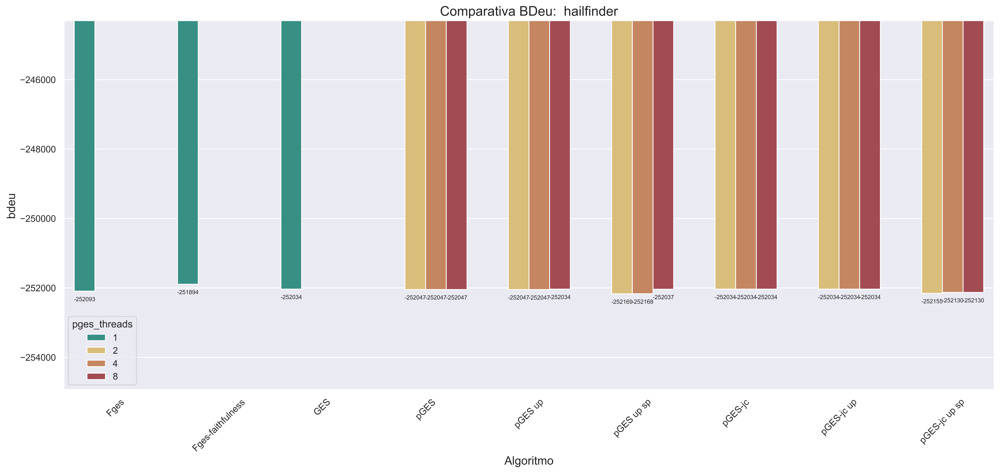

In [ ]:
plot("hailfinder", "bdeu", 0, 7)

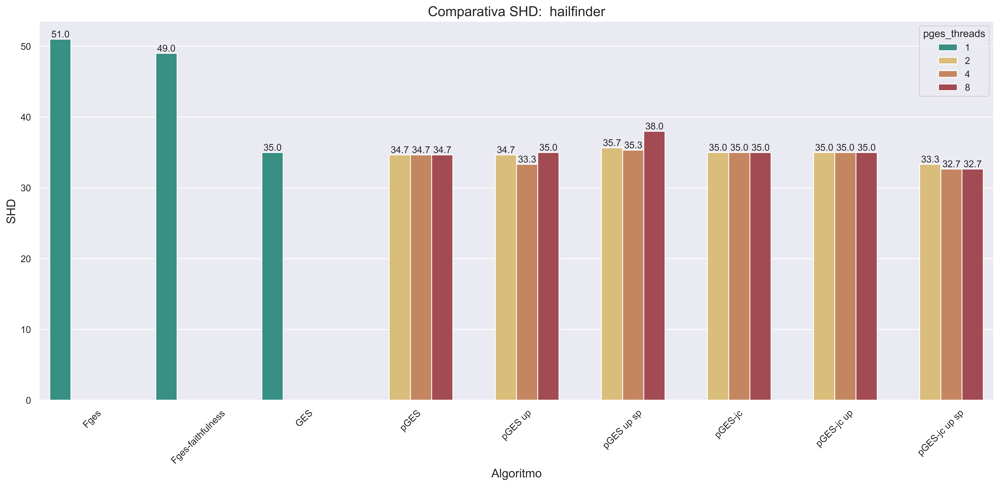

In [ ]:
plot("hailfinder", "SHD", 1, 11)

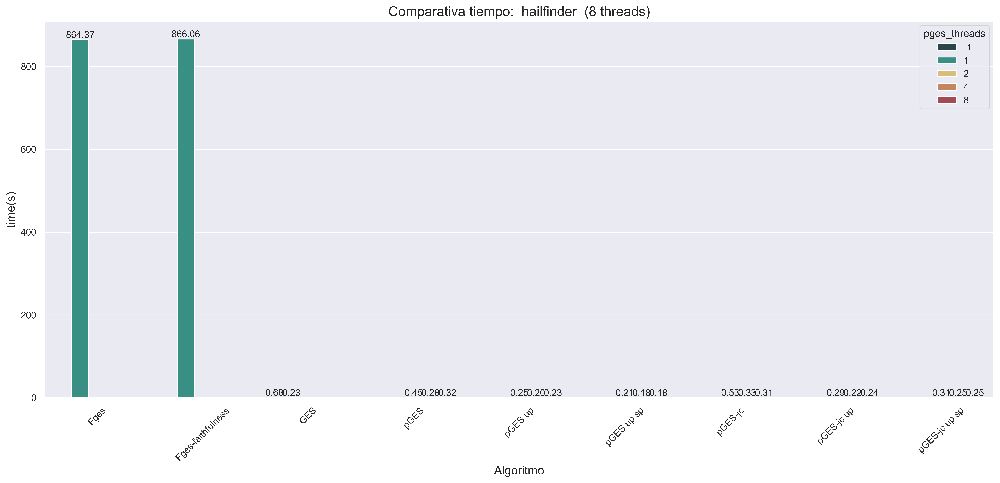

In [ ]:
plot("hailfinder", "time(s)", 2, 11, threads=8)

## Andes

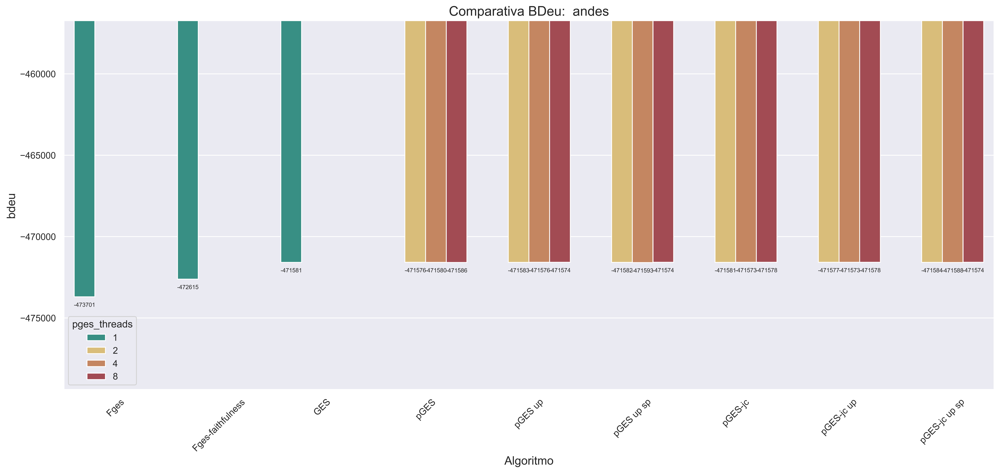

In [ ]:
plot("andes", "bdeu", 0, 7)

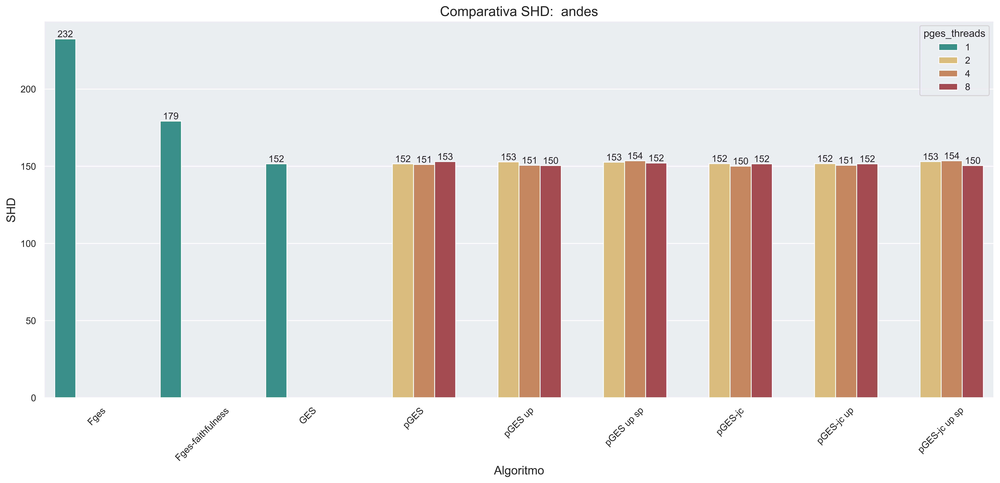

In [ ]:
plot("andes", "SHD", 0, 11)

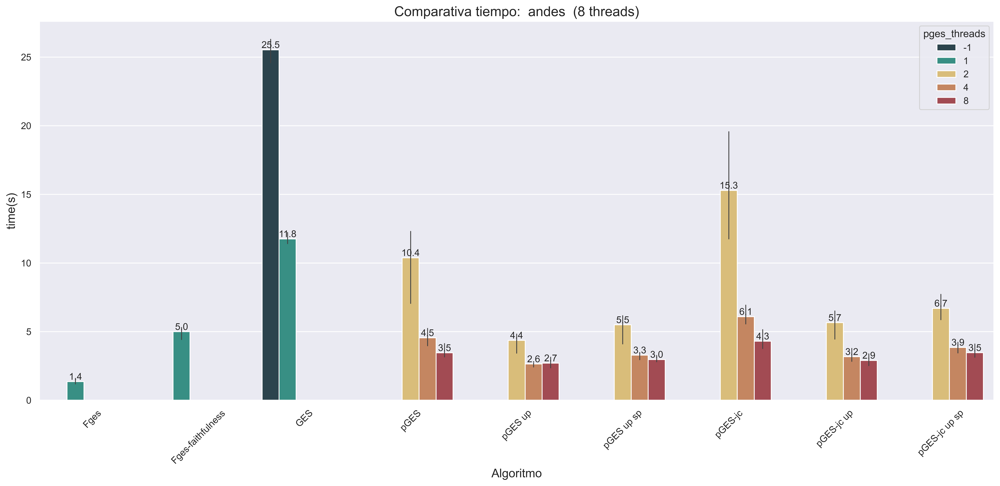

In [ ]:
plot("andes", "time(s)", 1, 11, threads=8)

## Pigs

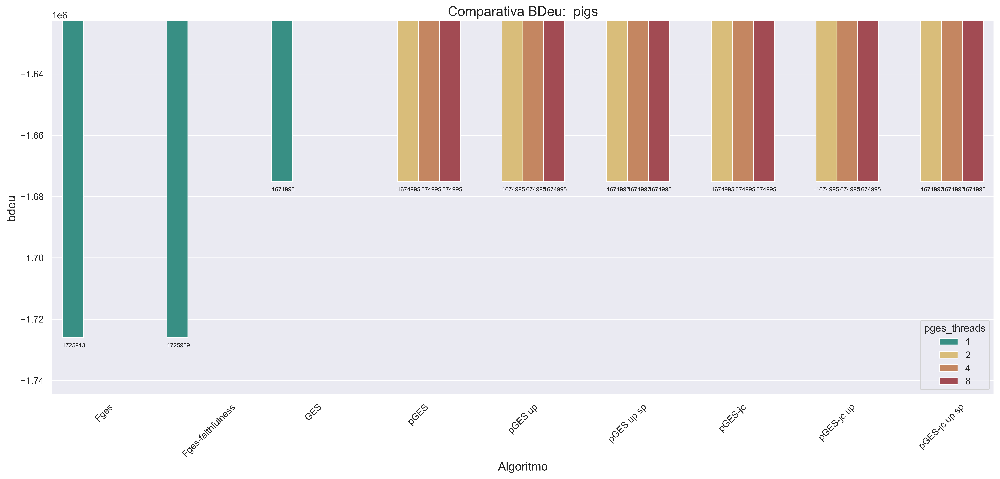

In [ ]:
plot("pigs", "bdeu", 0, 7)

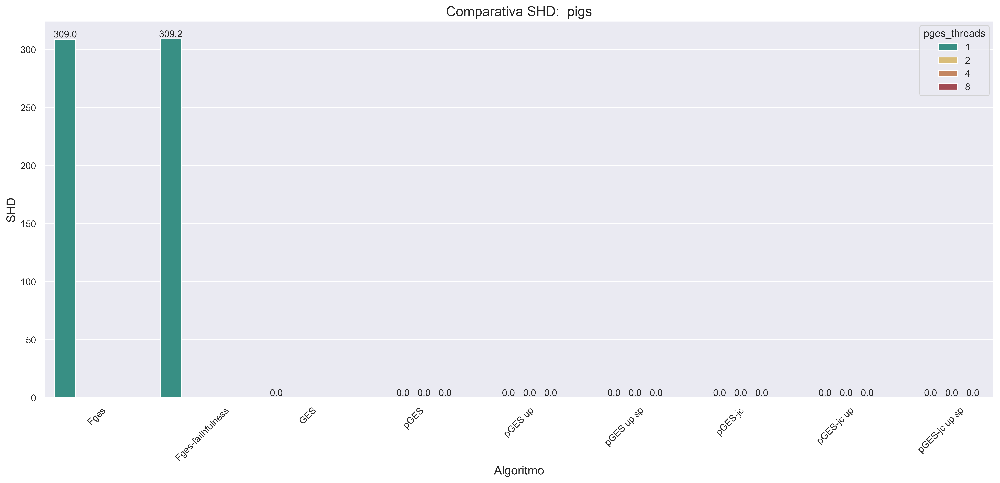

In [ ]:
plot("pigs", "SHD", 1, 11)

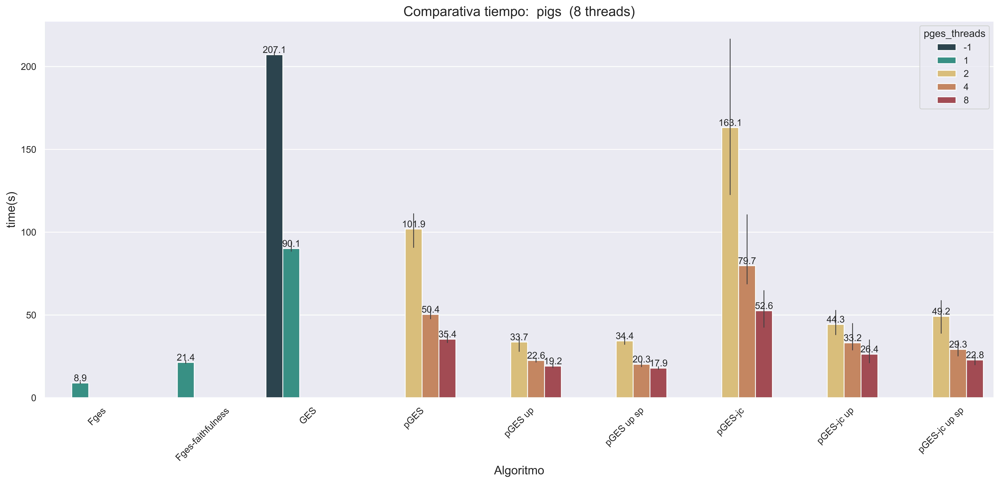

In [ ]:
plot("pigs", "time(s)", 1, 11, threads=8)

## Link

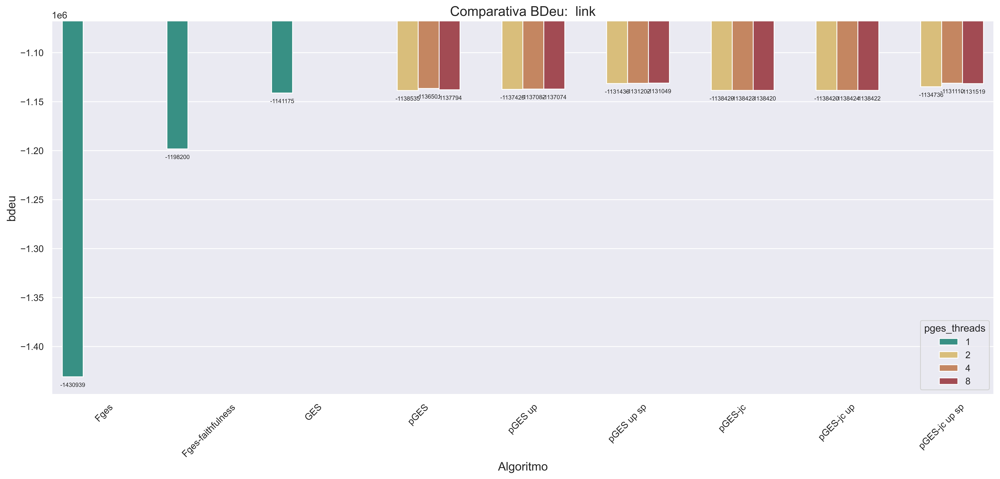

In [ ]:
plot("link", "bdeu", 0, 7)

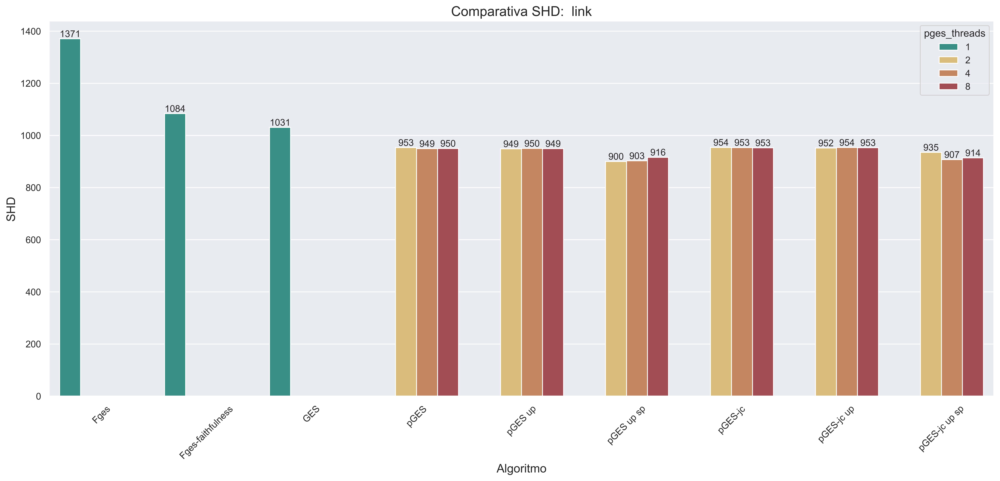

In [ ]:
plot("link", "SHD", 0, 11)

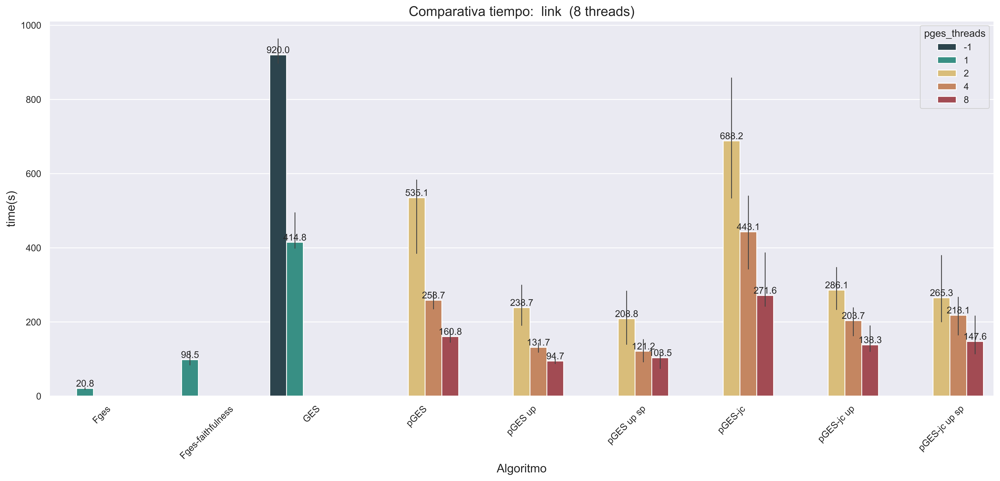

In [ ]:
plot("link", "time(s)", 1, 11, threads=8)

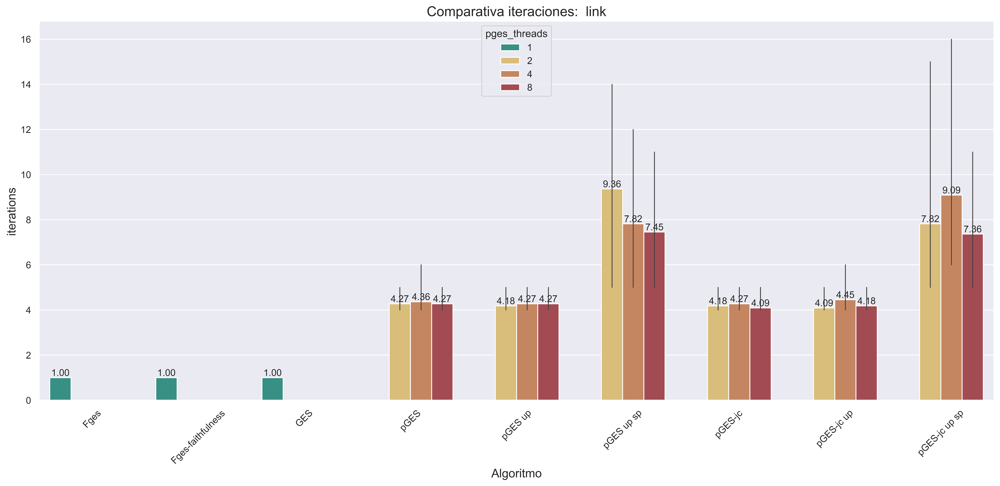

In [ ]:
plot("link", "iterations", 2, 11)

## Munin

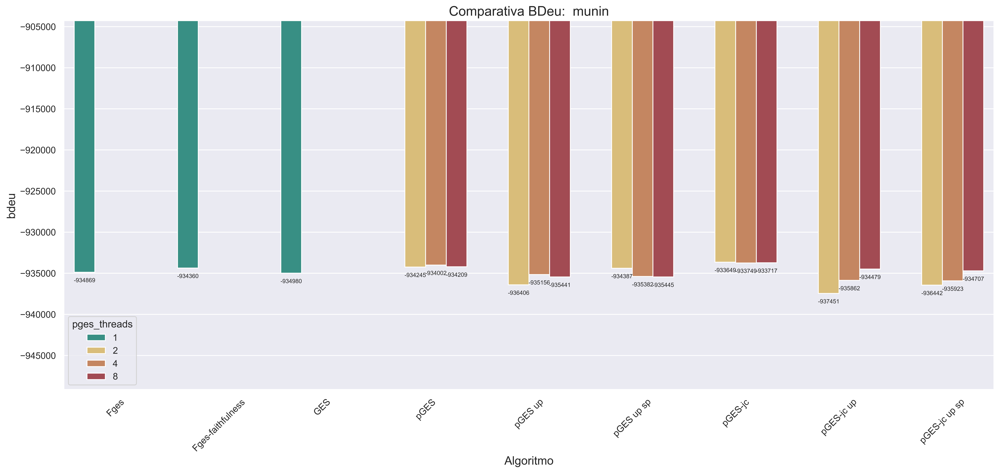

In [ ]:
plot("munin", "bdeu", 0, 7)

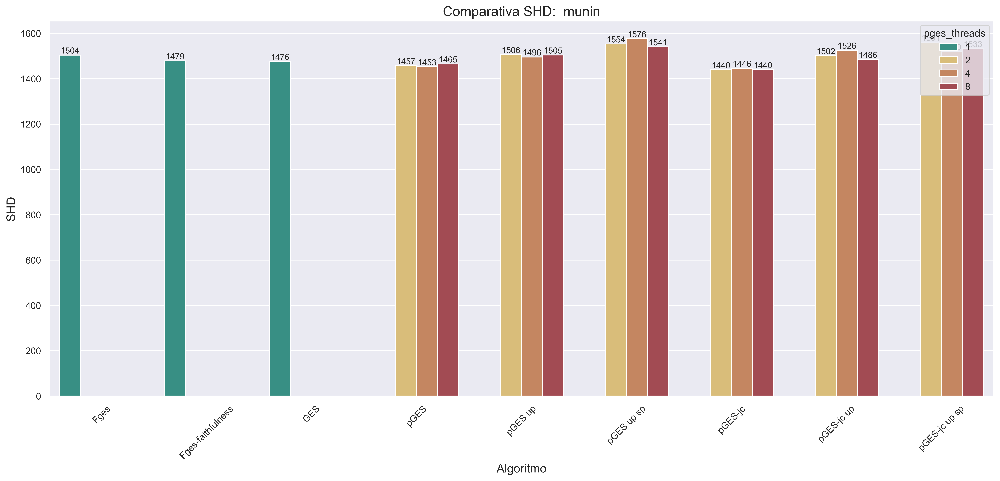

In [ ]:
plot("munin", "SHD", 0, 10)

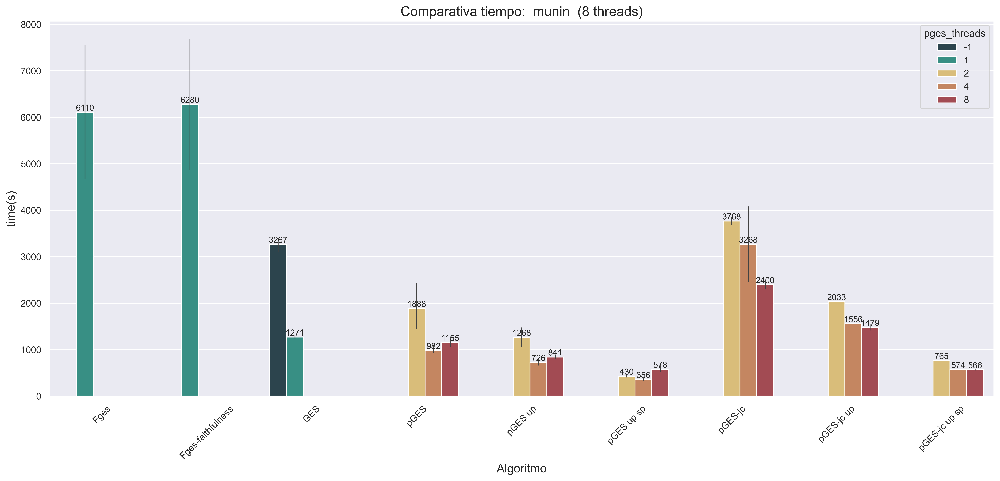

In [ ]:
plot("munin", "time(s)", 0, 10, threads=8)

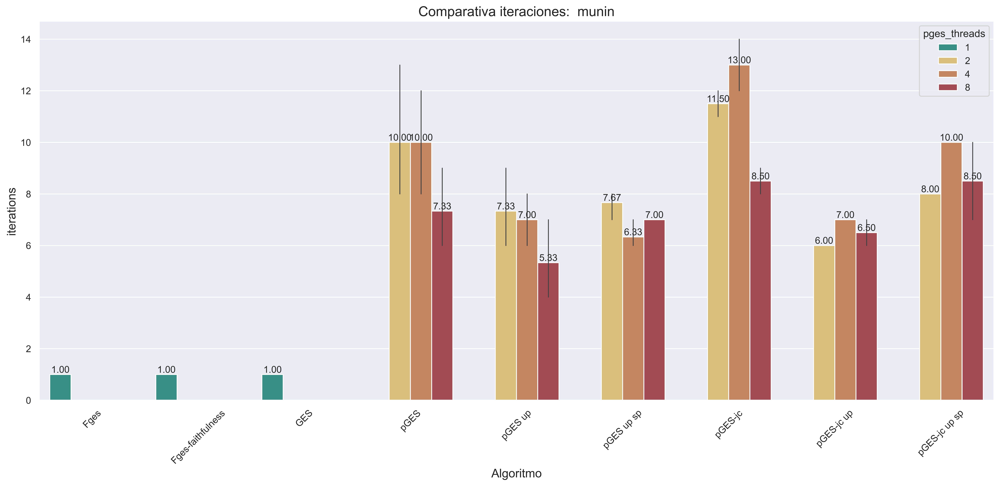

In [ ]:
plot("munin", "iterations", 2, 11)